In [31]:
import glob
import os

import albumentations as A
import cv2
import matplotlib.pyplot as plt
import numpy as np
import segmentation_models_pytorch as smp
import torch
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms
from tqdm import tqdm


In [32]:
work_dir = "./tiff"

In [33]:
class UnetPatchy(smp.Unet):
    def __init__(self, patch_size=(256, 256), patch_step=256, **kwargs):
        super().__init__(**kwargs)
        self.patch_size = patch_size
        self.patch_step = patch_step
        self.patch_h, self.patch_w = patch_size
        self.fold = torch.nn.Fold(output_size=(1536, 1536), kernel_size=kernel, stride=patch_size)
        self.unfold = torch.nn.Unfold(kernel_size=kernel, stride=patch_size)

    def tensor_to_patches(self, tensor):
        patches = self.unfold(tensor)  # [bs, c*k*k, num_folds]
        num_folds = patches.shape[2]
        patches = patches.view(tensor.shape[0], tensor.shape[1], self.patch_h, self.patch_w, -1)  # [bs, C, k, k, L]

        patches = patches.permute(0, 4, 1, 2, 3)  # [bs, L, C, k, k]

        patches = patches.reshape(tensor.shape[0] * num_folds, tensor.shape[1], self.patch_h, self.patch_w)  # [bs * L, C, k, k]

        return patches

    def patches_to_tensor(self, patches):  # [bs * L, C, k, k]
        c = patches.shape[1]
        tensor = patches.view(-1, 36, c, self.patch_h, self.patch_w)  # [bs, L, C, k, k]
        bs, L = tensor.shape[0], tensor.shape[1]
        tensor = tensor.permute(0, 2, 3, 4, 1)  # [bs, C, k, k, L]
        tensor = tensor.view(bs, -1, L)  # [bs, C, k, k, L]
        tensor = self.fold(tensor)
        return tensor

    def patch_forward(self, x):
        """Sequentially pass `x` trough model`s encoder, decoder and heads"""
        x = self.tensor_to_patches(x)
        self.check_input_shape(x)

        features = self.encoder(x)
        decoder_output = self.decoder(*features)

        masks = self.segmentation_head(decoder_output)
        masks = self.patches_to_tensor(masks)
        if self.classification_head is not None:
            labels = self.classification_head(features[-1])
            return masks, labels

        return masks

In [34]:
kernel = (256, 256)
patch_size = 256
fold = torch.nn.Fold(output_size=(1536, 1536), kernel_size=kernel, stride=patch_size)
unfold = torch.nn.Unfold(kernel_size=kernel, stride=patch_size)


def tensor_to_patches(tensor):  # [bs, c, h, w]
    bs, channels = tensor.shape[0], tensor.shape[1]
    patches = unfold(tensor)  # [bs, c*k*k, num_folds]
    num_folds = patches.shape[2]
    patches = patches.view(bs, channels, patch_size, patch_size, -1)  # [bs, C, k, k, L]

    patches = patches.permute(0, 4, 1, 2, 3)  # [bs, L, C, k, k]

    patches = patches.reshape(bs * num_folds, channels, patch_size, patch_size)  # [bs * L, C, k, k]

    return patches


def patches_to_tensor(patches):  # [bs * L, C, k, k]
    channels = patches.shape[1]
    tensor = patches.view(-1, 36, channels, patch_size, patch_size)  # [bs, L, C, k, k]
    bs, num_folds = tensor.shape[0], tensor.shape[1]
    tensor = tensor.permute(0, 2, 3, 4, 1)  # [bs, C, k, k, L]
    tensor = tensor.view(bs, -1, num_folds)  # [bs, C* k* k, L]
    tensor = fold(tensor)  # [bs, c, h, w]
    return tensor

In [35]:
class MyDataset(Dataset):
    def __init__(self, dir_name, transform=None, preprocessing=None):
        self.data_path = dir_name
        self.label_path = f"{dir_name}_labels"
        self.data_filenames = sorted(glob.glob(f"{self.data_path}/*.tiff"))
        self.label_filenames = sorted(glob.glob(f"{self.label_path}/*.tif"))
        self.transform = transform
        self.to_tensor = transforms.ToTensor()
        self.preprocessing = preprocessing
        self.gray = transforms.Grayscale()

    def __getitem__(self, idx):
        image = cv2.imread(self.data_filenames[idx])
        mask = cv2.imread(self.label_filenames[idx])
        mask = np.where(image == 255, 0, mask)
        mask = mask[:,:,0]
        if self.transform:
            augs = self.transform(image=image, mask=mask)
            image, mask = augs['image'], augs['mask']

        if self.preprocessing:
            augs = self.preprocessing(image=image, mask=mask)
            image, mask = augs['image'], augs['mask']

        image = self.to_tensor(image).type('torch.FloatTensor')
        mask = self.to_tensor(mask).type('torch.FloatTensor')
        return image, mask

    def __len__(self):
        return len(self.data_filenames)

In [36]:
def center_crop_batch(batch):
    crop = transforms.CenterCrop((1500, 1500))
    return crop(batch)

In [37]:
def get_train_transformation():
    transform = A.Compose([
        A.PadIfNeeded(min_height=1536, min_width=1536, always_apply=True, border_mode=0),
        A.OneOf(
            [
                A.HorizontalFlip(p=1),
                A.VerticalFlip(p=1),
                A.RandomRotate90(p=1),
            ],
            p=0.75,
        ),
    ], p=1)
    return transform


def get_val_test_transformation():
    transform = A.Compose([
        A.PadIfNeeded(min_height=1536, min_width=1536, always_apply=True, border_mode=0),
    ], p=1)
    return transform


def get_preprocessing(preprocessing_fn=None):
    """Construct preprocessing transform    
    Args:
        preprocessing_fn (callable): data normalization function 
            (can be specific for each pretrained neural network)
    Return:
        transform: albumentations.Compose
    """
    _transform = []
    if preprocessing_fn:
        _transform.append(A.Lambda(image=preprocessing_fn))

    return A.Compose(_transform)


In [38]:
ENCODER = 'resnet50'
ENCODER_WEIGHTS = 'imagenet'
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = UnetPatchy(
    encoder_name=ENCODER,
    encoder_weights=ENCODER_WEIGHTS,
    in_channels=3, classes=1,
).to(DEVICE)
model_filename = "new_model.pth"
if model_filename in os.listdir():
    model.load_state_dict(torch.load(model_filename))

preprocessing_fn = smp.encoders.get_preprocessing_fn(ENCODER, ENCODER_WEIGHTS)

In [39]:
train_dataset = MyDataset(f"{work_dir}/train", transform=get_train_transformation(), preprocessing=get_preprocessing(preprocessing_fn), )
val_dataset = MyDataset(f"{work_dir}/val", transform=get_val_test_transformation(), preprocessing=get_preprocessing(preprocessing_fn), )
test_dataset = MyDataset(f"{work_dir}/test", transform=get_val_test_transformation(), preprocessing=get_preprocessing(preprocessing_fn), )

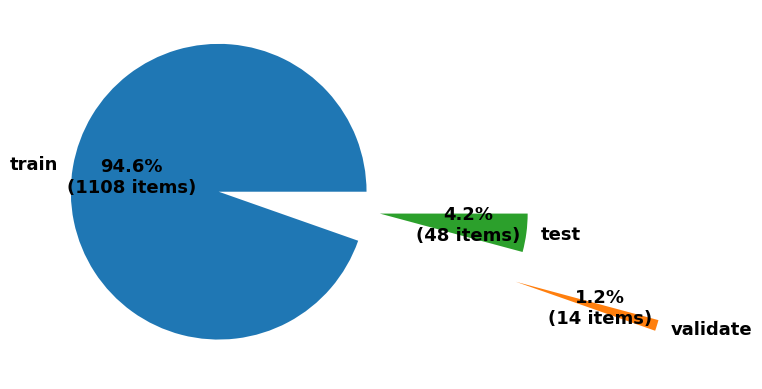

In [40]:
def plot_datasets_items():
    def func(pct, allvalues):
        absolute = int(pct / 100. * np.sum(allvalues))
        return "{:.1f}%\n({:d} items)".format(pct, absolute)

    explode = [0.1, 2, 1]

    stat = {"train": len(train_dataset), "validate": len(val_dataset), "test": len(test_dataset)}
    plt.pie(stat.values(), labels=stat.keys(), autopct=lambda pct: func(pct, list(stat.values())), explode=explode,
            textprops={"color": "black", "weight": "bold", 'fontsize': 13})
    plt.show()


plot_datasets_items()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


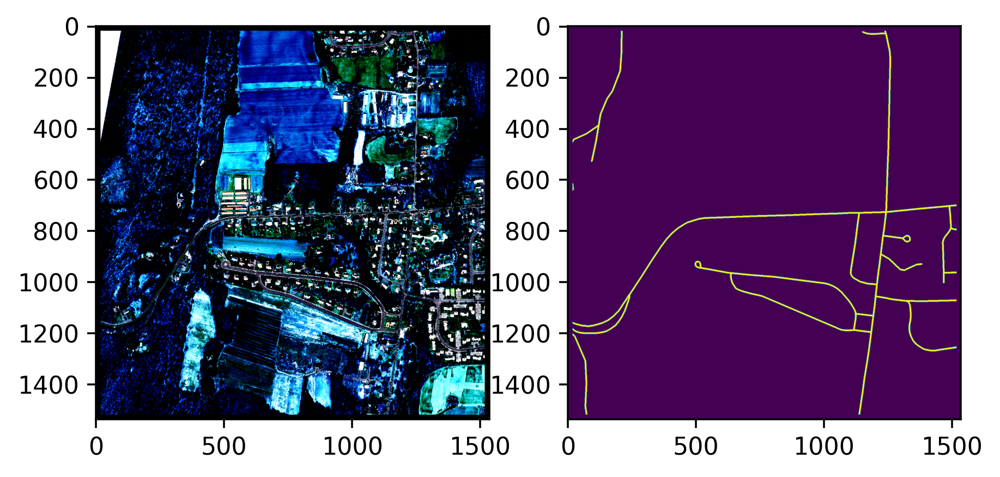

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


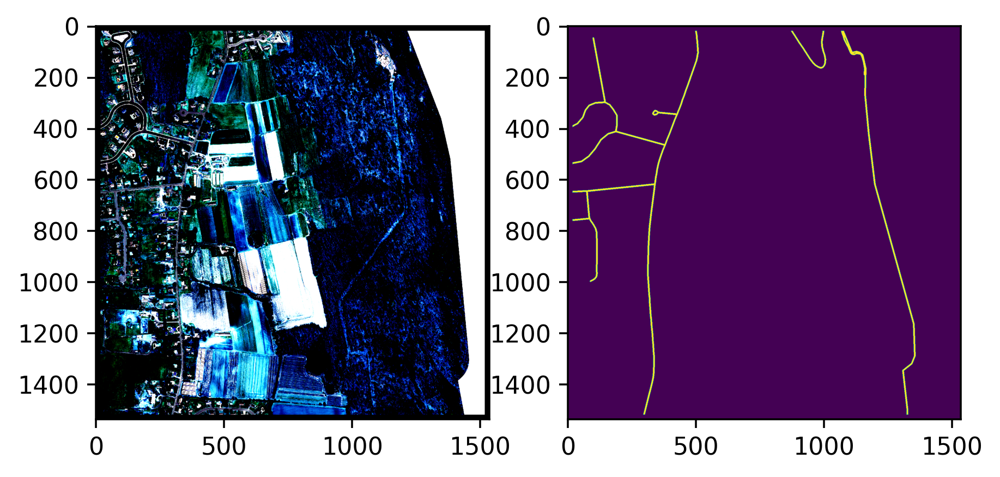

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


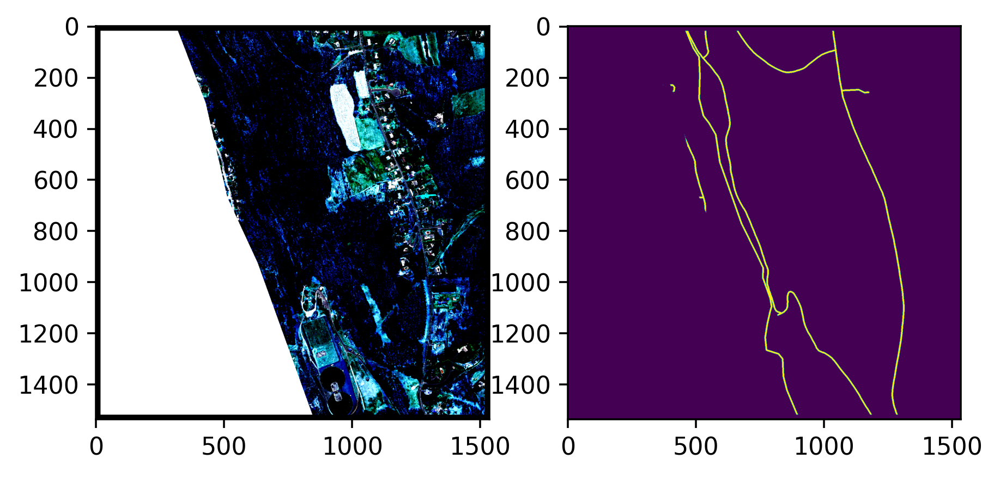

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


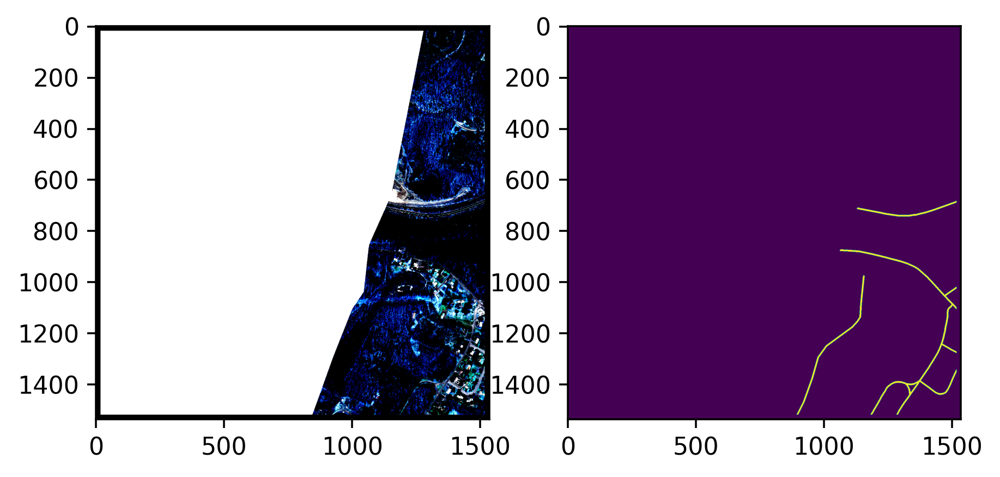

In [41]:
def visualize_pics():
    for i in range(2, 6):
        image, mask = train_dataset[i]
        image = image.permute(1, 2, 0)
        mask = mask.permute(1, 2, 0)
        fig, axs = plt.subplots(nrows=1, ncols=2, dpi=320)
        axs[0].imshow(image)
        axs[1].imshow(mask)
        plt.show()

visualize_pics()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


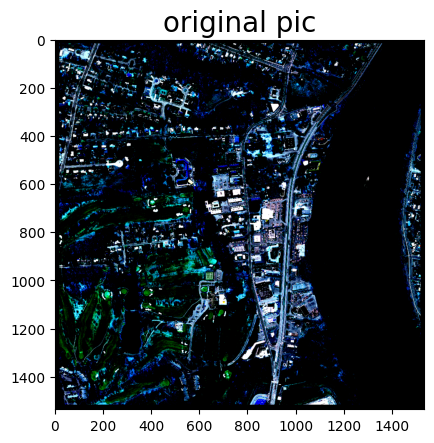

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

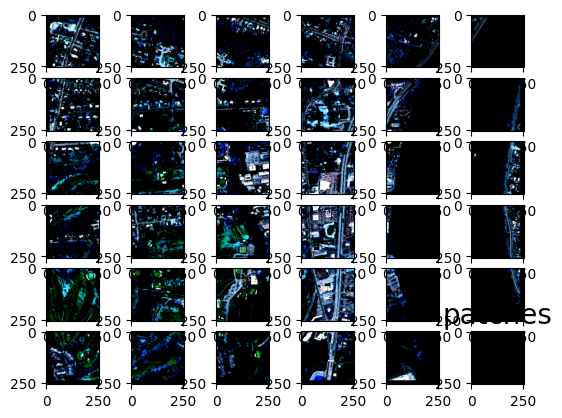

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


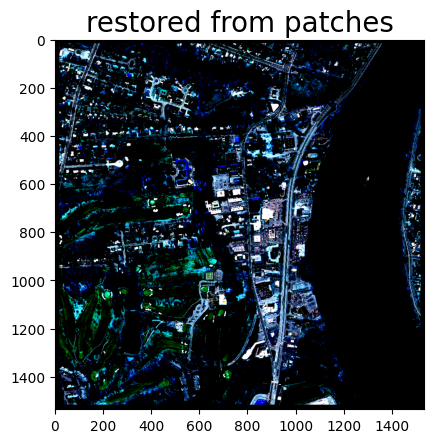

In [42]:
def visualize_patches():
    train_loader = DataLoader(train_dataset, batch_size=1, shuffle=True)
    for image, mask in train_loader:
        image_patches = tensor_to_patches(image)
        label_patches = tensor_to_patches(mask)
        plt.title("original pic", fontsize=20)
        plt.imshow(image.squeeze().permute(1, 2, 0))
        plt.show()
        fig, axs = plt.subplots(nrows=6, ncols=6)
        plt.title("patches", fontsize=20)
        for n in range(36):
            patch = image_patches[n, :, :, :].squeeze().permute(1, 2, 0)
            i = n // 6
            j = n % 6
            axs[i][j].imshow(patch)
        plt.show()
        image_restored = patches_to_tensor(image_patches)
        plt.title("restored from patches", fontsize=20)
        plt.imshow(image_restored.squeeze(dim=0).permute(1, 2, 0))
        plt.show()
        break

visualize_patches()


In [43]:
TRAINING = False

# Set num of epochs
EPOCHS = 25
BATCH_SIZE = 1  #
PATCH_SIZE = 12  # нада штоб BS * 36 делилось на PS без остатка
# Set device: `cuda` or `cpu`

criterion = torch.nn.BCEWithLogitsLoss()

# define optimizer
optimizer = torch.optim.Adam([
    dict(params=model.parameters(), lr=0.00008),
])

min_valid_loss = np.inf

In [44]:
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False)

In [45]:
my_data = [[0.09835630982904636, 0.06517107563776106, 0.06120719129537516, 0.05912567343161897, 0.05749353313290144, 0.05599517943986534, 0.0550857130449472, 0.05438047106735087, 0.05344948637717483, 0.0526500157956053, 0.05213562140574027, 0.0514012666873268, 0.05071273001821513, 0.04983396456996573, 0.049445461072000686, 0.05038611876164748, 0.04997606858641132, 0.0495198204312908, 0.04875302107414957, 0.04799123343765525, 0.04734738652083441, 0.04672016248792811, 0.04613431032978754],
[0.31291988754308236, 0.4257440720112384, 0.4488903950315171, 0.46061515197708397, 0.47190607577362714, 0.4820767553160348, 0.48724210638552146, 0.4943500310542526, 0.49752895216106596, 0.5051685500304443, 0.5062460851738293, 0.5137414243559479, 0.51512892344142, 0.5190495666470681, 0.52125536839088, 0.5176365882887543, 0.5199539724539747, 0.5223795277608246, 0.5270073956400086, 0.5294237686965548, 0.5352442154803719, 0.538420983089691, 0.5396504415128636],
[0.35831099140343514, 0.4801350640069409, 0.503347083733399, 0.5150076421387704, 0.5262562795048812, 0.5368802739901994, 0.5414953471892087, 0.5485917317124948, 0.5523608224090347, 0.5599775995992905, 0.5609070604803343, 0.5691851679805783, 0.5702929776282148, 0.5741482074565635, 0.5770073889553565, 0.5724668175892791, 0.5757588722237418, 0.5778563179183779, 0.5833382121758085, 0.5850967780447421, 0.5913727255916169, 0.594754087702882, 0.5960085536748381],
[0.6493185105185323, 0.7450368549031606, 0.7567321162556313, 0.7616614946731778, 0.7685145078261809, 0.7710381485607976, 0.7717283482004075, 0.7760626478558103, 0.775927456326587, 0.780062290083464, 0.7795796226023366, 0.7832614286316231, 0.7832469957877037, 0.7855446077609721, 0.7849035081502425, 0.7842304317298856, 0.7838052574776214, 0.7855558675306811, 0.7886976557844634, 0.7896087842526163, 0.7908609026381561, 0.7902504719189243, 0.7879830495269468],
[0.1268996269043003, 0.09279630625886576, 0.09026221753585906, 0.09393941877143722, 0.08715061772437321, 0.019073987563400445, 0.10033234971619788, 0.0884855600251328, 0.08455135921637216, 0.08468808517569588, 0.0825765517850717, 0.08436209748366053, 0.08378223383000918, 0.08445369753809202, 0.0872846454204548, 0.08560353313528356, 0.08876796013542586, 0.08943702032168704, 0.08489415741392543, 0.08850157460463898, 0.08243065549149402, 0.08731721252912567, 0.09100467299244235, 0.09413388752866358],
[0.31846605168093867, 0.4934568513975005, 0.5231703241004485, 0.4309370873494311, 0.5314479600920778, 0.185795708060826, 0.3656195788263427, 0.5001434987226039, 0.5344160435060321, 0.5297210368909293, 0.5444986195428113, 0.5385646209640551, 0.5287224258171587, 0.4932414470923219, 0.5006139272816488, 0.5281572208845182, 0.5199236578041209, 0.5285297268787374, 0.5389568652943751, 0.5293744776621069, 0.5574397464987471, 0.5408790867815616, 0.5354803961267052, 0.5145144874558005],
[0.3308490414775989, 0.5436351178033826, 0.57517335664243, 0.4569963805654765, 0.5841364366005272, 0.20255789236264823, 0.3770598898118234, 0.5391696411316707, 0.5825460260173699, 0.5814288231977341, 0.5928481107658167, 0.5848117084621104, 0.5683123802779368, 0.524857196187582, 0.5348746482297373, 0.5724435679598466, 0.56467522551193, 0.5736439870617224, 0.5853280287413762, 0.5768609624415431, 0.6204004524781538, 0.5870248559495661, 0.5791146843410535, 0.5568674473715974],
[0.8989901161167331, 0.8396925306913291, 0.8488229156857676, 0.8797860298494711, 0.8506542660336587, 0.2895948920665565, 0.9174385026476648, 0.8724895549900475, 0.8614337277769389, 0.8525661274446829, 0.8640902944997383, 0.8664481558169692, 0.8779030548886275, 0.8890085876650428, 0.884344418077629, 0.869250793440614, 0.8645080567489064, 0.8676798669670547, 0.8657368585098995, 0.8606144329076981, 0.841830174335852, 0.8668148472333963, 0.8700748905887511, 0.8666522156670905]]

train_loss_arr = my_data[0]
train_iou_arr = my_data[1]
train_recall_arr = my_data[2]
train_precision_arr = my_data[3]
val_loss_arr = my_data[4]
val_iou_arr = my_data[5]
val_recall_arr = my_data[6]
val_precision_arr = my_data[7]

In [46]:
%%time

if TRAINING:

    for i in range(0, EPOCHS):
        # Perform training & validation
        print('\nEpoch: {}'.format(i))
        model.train()
        train_loss = 0.0
        train_total_iou = 0.0
        train_total_precision = 0.0
        train_total_recall = 0.0
        len_train_loader = len(train_loader)
        for inputs, labels in tqdm(train_loader, mininterval=1):
            # Move input and label tensors to the device
            input_patches = tensor_to_patches(inputs)
            label_patches = tensor_to_patches(labels)
            num_patches = input_patches.shape[0]
            for i in range(0, num_patches, PATCH_SIZE):
                model_inputs = input_patches[i:i + PATCH_SIZE, :, :, :].to(DEVICE)
                model_labels = label_patches[i:i + PATCH_SIZE, :, :, :].to(DEVICE)
                # Zero out the optimizer
                optimizer.zero_grad()
                # Forward pass
                model_outputs = model(model_inputs)
                loss = criterion(model_outputs, model_labels)
                train_loss += loss.item() / (len(train_loader) * BATCH_SIZE * 36 / PATCH_SIZE)
                # Backward pass
                loss.backward()
                optimizer.step()
                predicted_masks = (model_outputs > 0.5).float()
                tp = ((predicted_masks == 1) & (model_labels == 1)).sum().item()
                fp = ((predicted_masks == 1) & (model_labels == 0)).sum().item()
                fn = ((predicted_masks == 0) & (model_labels == 1)).sum().item()
                tn = ((predicted_masks == 1) & (model_labels == 0)).sum().item()
                intersection = torch.logical_and(predicted_masks, model_labels).sum().item()
                union = torch.logical_or(predicted_masks, model_labels).sum().item()
                iou = intersection / union if union != 0 else 0
                precision = tp / (tp + fp) if tp + fp > 0 else 0.0
                recall = tp / (tp + fn) if tp + fn > 0 else 0.0
                train_total_iou += iou
                train_total_recall += recall
                train_total_precision += precision
        iou = train_total_iou / (len(train_loader) * BATCH_SIZE * 36 / PATCH_SIZE)
        recall = train_total_recall / (len(train_loader) * BATCH_SIZE * 36 / PATCH_SIZE)
        precision = train_total_precision / (len(train_loader) * BATCH_SIZE * 36 / PATCH_SIZE)
        train_iou_arr.append(iou)
        train_recall_arr.append(recall)
        train_precision_arr.append(precision)
        train_loss_arr.append(train_loss)
        print("===TRAIN===")
        print(f"loss: {train_loss}")
        print(f"iou: {iou}")
        print(f"recall: {recall}")
        print(f"precision: {precision}")
        
        model.eval()
        val_loss = 0
        val_total_iou = 0.0
        val_total_precision = 0.0
        val_total_recall = 0.0
        len_val_loader = len(train_loader)
        with torch.no_grad():
            for inputs, labels in tqdm(val_loader, mininterval=1):
                # Move input and label tensors to the device
                input_patches = tensor_to_patches(inputs)
                label_patches = tensor_to_patches(labels)
                num_patches = input_patches.shape[0]
                for i in range(0, num_patches, PATCH_SIZE):
                    model_inputs = input_patches[i:i + PATCH_SIZE, :, :, :].to(DEVICE)
                    model_labels = label_patches[i:i + PATCH_SIZE, :, :, :].to(DEVICE)
                    # Forward pass
                    model_outputs = model(model_inputs)
                    loss = criterion(model_outputs, model_labels)
                    val_loss += loss.item() / (len(val_loader) * BATCH_SIZE * 36 / PATCH_SIZE)
                    # Backward pass
                    predicted_masks = (model_outputs > 0.5).float()
                    tp = ((predicted_masks == 1) & (model_labels == 1)).sum().item()
                    fp = ((predicted_masks == 1) & (model_labels == 0)).sum().item()
                    fn = ((predicted_masks == 0) & (model_labels == 1)).sum().item()
                    tn = ((predicted_masks == 1) & (model_labels == 0)).sum().item()
                    intersection = torch.logical_and(predicted_masks, model_labels).sum().item()
                    union = torch.logical_or(predicted_masks, model_labels).sum().item()
                    iou = intersection / union if union != 0 else 0
                    precision = tp / (tp + fp) if tp + fp > 0 else 0.0
                    recall = tp / (tp + fn) if tp + fn > 0 else 0.0
                    val_total_iou += iou
                    val_total_recall += recall
                    val_total_precision += precision
            iou = val_total_iou / (len(val_loader) * BATCH_SIZE * 36 / PATCH_SIZE)
            recall = val_total_recall / (len(val_loader) * BATCH_SIZE * 36 / PATCH_SIZE)
            precision = val_total_precision / (len(val_loader) * BATCH_SIZE * 36 / PATCH_SIZE)
            val_iou_arr.append(iou)
            val_recall_arr.append(recall)
            val_precision_arr.append(precision)
            val_loss_arr.append(val_loss)
            print("===VALIDATION===")
            print(f"loss: {val_loss}")
            print(f"iou: {iou}")
            print(f"recall: {recall}")
            print(f"precision: {precision}")
        if val_loss < min_valid_loss:
            print("LOSS DECREASED. SAVING MODEL")
            torch.save(model.state_dict(), model_filename)
            min_valid_loss = val_loss
            

CPU times: total: 0 ns
Wall time: 0 ns


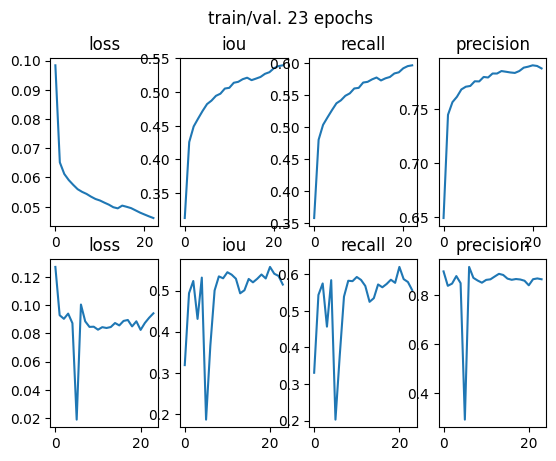

In [47]:
fig, axs = plt.subplots(nrows=2, ncols=4)
fig.suptitle(f"train/val. {len(train_loss_arr)} epochs")
axs[0][0].plot(train_loss_arr)
axs[0][0].set_title("loss")
axs[0][1].plot(train_iou_arr)
axs[0][1].set_title("iou")
axs[0][2].plot(train_recall_arr)
axs[0][2].set_title("recall")
axs[0][3].plot(train_precision_arr)
axs[0][3].set_title("precision")
axs[1][0].plot(val_loss_arr)
axs[1][0].set_title("loss")
axs[1][1].plot(val_iou_arr)
axs[1][1].set_title("iou")
axs[1][2].plot(val_recall_arr)
axs[1][2].set_title("recall")
axs[1][3].plot(val_precision_arr)
axs[1][3].set_title("precision")
plt.show()

In [48]:
print(train_loss_arr)
print(train_iou_arr)
print(train_recall_arr)
print(train_precision_arr)
print(val_loss_arr)
print(val_iou_arr)
print(val_recall_arr)
print(val_precision_arr)

[0.09835630982904636, 0.06517107563776106, 0.06120719129537516, 0.05912567343161897, 0.05749353313290144, 0.05599517943986534, 0.0550857130449472, 0.05438047106735087, 0.05344948637717483, 0.0526500157956053, 0.05213562140574027, 0.0514012666873268, 0.05071273001821513, 0.04983396456996573, 0.049445461072000686, 0.05038611876164748, 0.04997606858641132, 0.0495198204312908, 0.04875302107414957, 0.04799123343765525, 0.04734738652083441, 0.04672016248792811, 0.04613431032978754]
[0.31291988754308236, 0.4257440720112384, 0.4488903950315171, 0.46061515197708397, 0.47190607577362714, 0.4820767553160348, 0.48724210638552146, 0.4943500310542526, 0.49752895216106596, 0.5051685500304443, 0.5062460851738293, 0.5137414243559479, 0.51512892344142, 0.5190495666470681, 0.52125536839088, 0.5176365882887543, 0.5199539724539747, 0.5223795277608246, 0.5270073956400086, 0.5294237686965548, 0.5352442154803719, 0.538420983089691, 0.5396504415128636]
[0.35831099140343514, 0.4801350640069409, 0.50334708373339

In [49]:
print(min_valid_loss)

inf


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


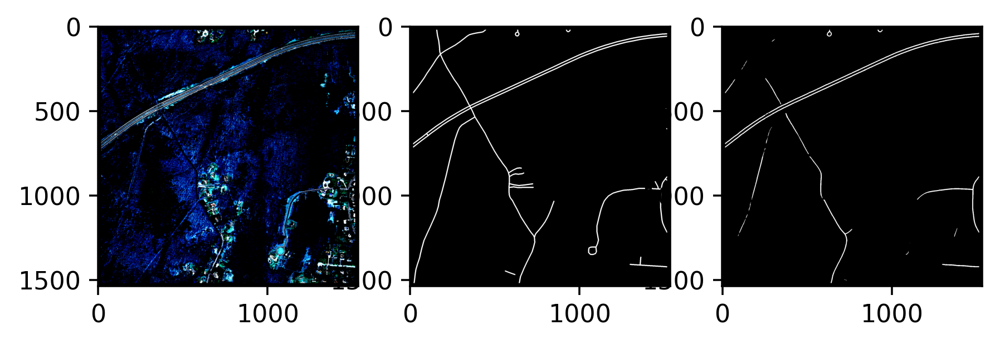

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


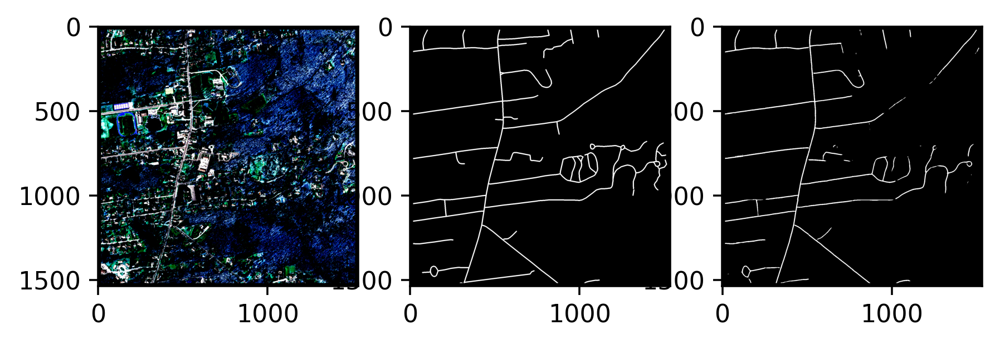

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


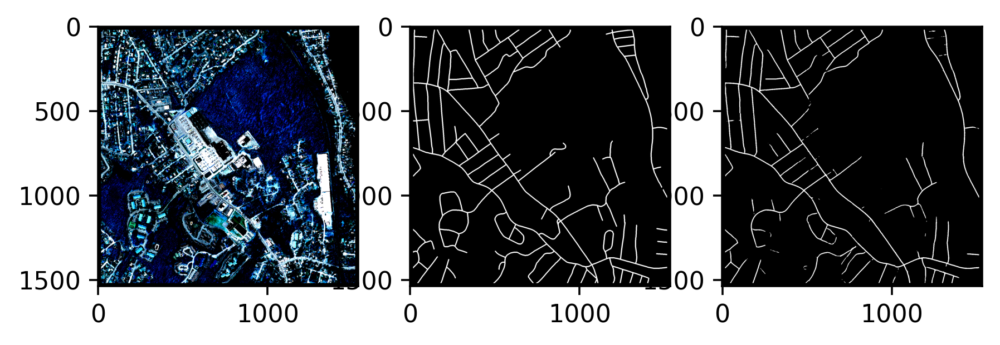

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


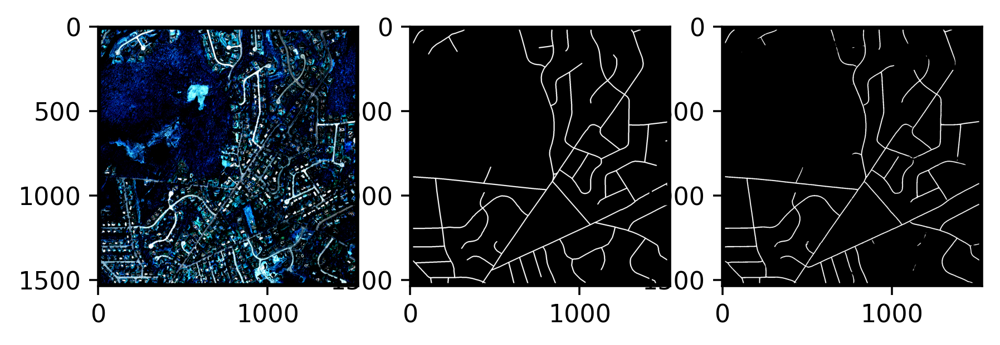

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


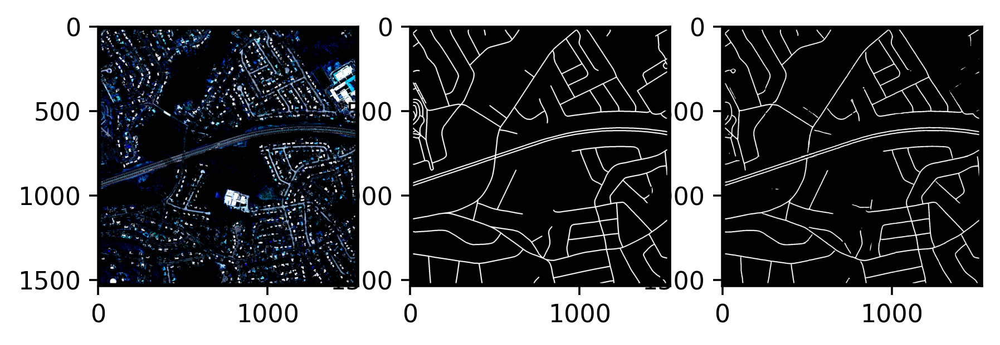

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


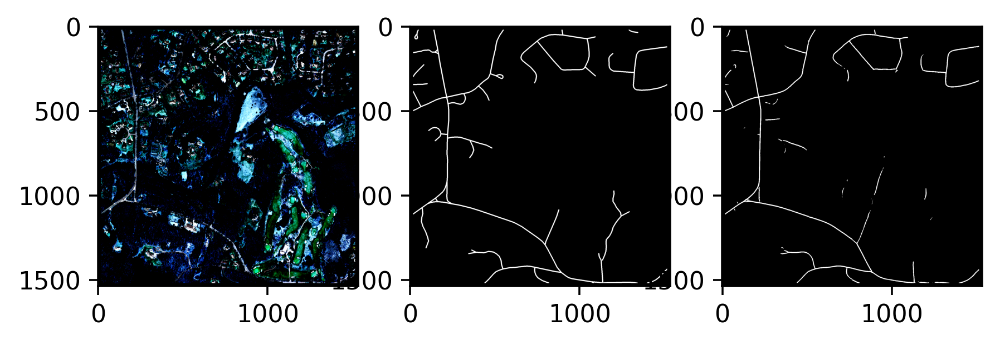

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


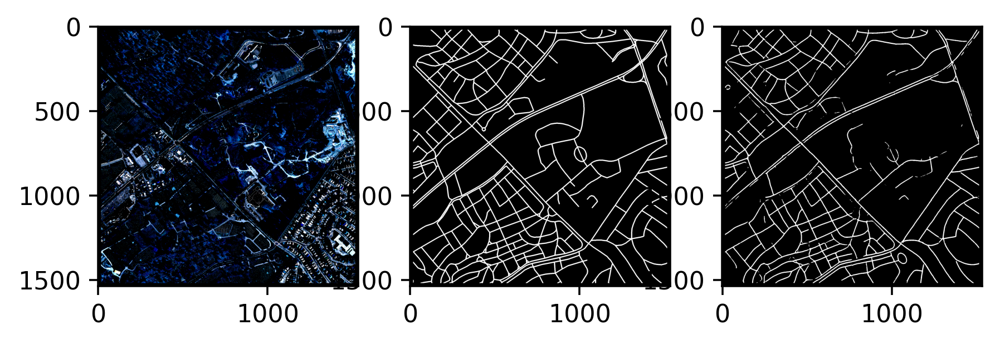

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


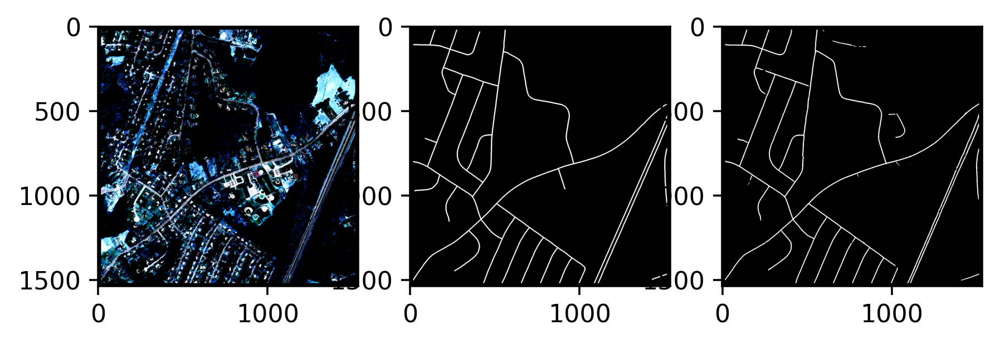

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


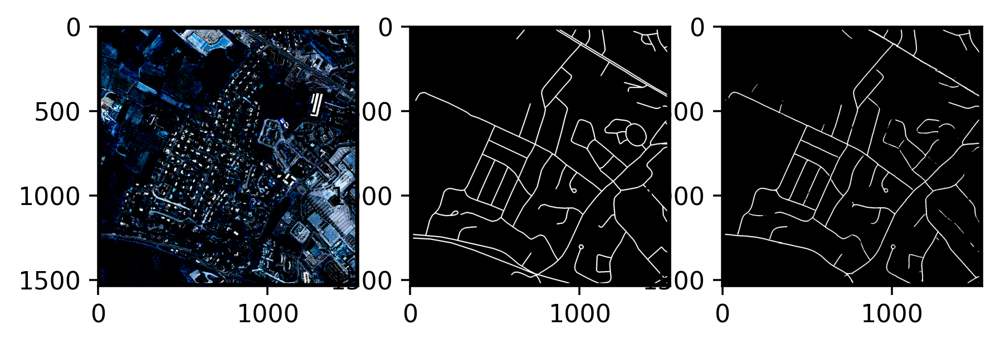

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


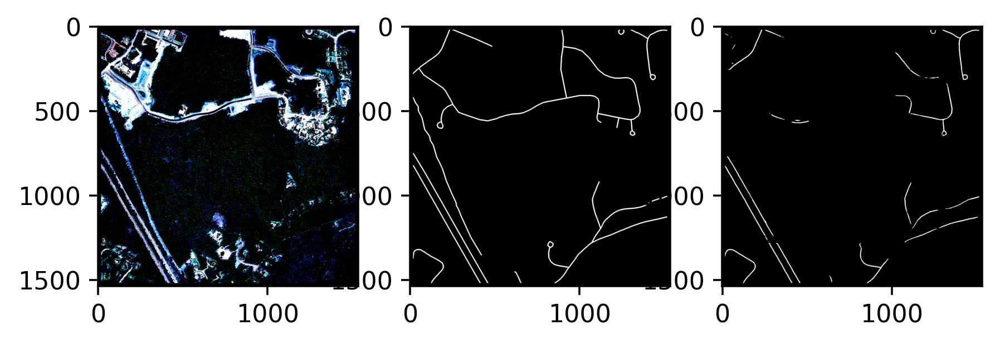

In [50]:
model.eval()
test_loss = 0.0
test_total_iou = 0.0
test_total_precision = 0.0
test_total_recall = 0.0
len_test_loader = len(train_loader)
with torch.no_grad():
    for idx, (inputs, labels) in enumerate(test_loader):
        # Move input and label tensors to the device
        inputs = inputs.to(DEVICE)
        labels = labels.to(DEVICE)
        
        outputs = model.patch_forward(inputs)
        loss = criterion(outputs, labels)
        test_loss += loss.item() / (len(test_loader) * BATCH_SIZE * 36 / PATCH_SIZE)
        predicted_masks = (outputs > 0.5).float()
        
        tp = ((predicted_masks == 1) & (labels == 1)).sum().item()
        fp = ((predicted_masks == 1) & (labels == 0)).sum().item()
        fn = ((predicted_masks == 0) & (labels == 1)).sum().item()
        tn = ((predicted_masks == 1) & (labels == 0)).sum().item()
        intersection = torch.logical_and(predicted_masks, labels).sum().item()
        union = torch.logical_or(predicted_masks, labels).sum().item()
        iou = intersection / union if union != 0 else 0
        precision = tp / (tp + fp) if tp + fp > 0 else 0.0
        recall = tp / (tp + fn) if tp + fn > 0 else 0.0
        test_total_iou += iou
        test_total_recall += recall
        test_total_precision += precision
        if idx % 5 == 0:
            fig, axs = plt.subplots(nrows=1, ncols=3, dpi=320)
            axs[0].imshow(inputs.squeeze(dim=0).permute(1,2,0).cpu().detach())
            axs[1].imshow(labels.squeeze(dim=0).permute(1,2,0).cpu().detach(), cmap="gray")
            axs[2].imshow(predicted_masks.squeeze(dim=0).permute(1,2,0).cpu().detach(), cmap="gray")
            plt.show()
    
    iou = test_total_iou / len(test_loader)
    recall = test_total_recall / len(test_loader)
    precision = test_total_precision / len(test_loader)

In [51]:
print("===TEST===")
print(f"loss: {test_loss}")
print(f"iou: {iou}")
print(f"recall: {recall}")
print(f"precision: {precision}") 

===TEST===
loss: 0.01813652705667274
iou: 0.5855214688998079
recall: 0.636688947100368
precision: 0.8782567527745444
